# Mass-Spring-Damper System: Analyzing the Principal Components of the $R_X$ and $R_V$ Data Matrixes

In [1]:
### Importing Libraries

import sys
print(sys.version)
import os
import time


### Defining WORKSPACE_PATH

# WORKSPACE_PATH = os.environ['WORKSPACE_PATH']
WORKSPACE_PATH = os.path.join(os.getcwd(), '../../../../../')
ROMNet_fld     = os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/')


### Importing External Libraries

import numpy                             as np
import pandas                            as pd


### Importing Matplotlib and Its Style

import matplotlib.pyplot                 as plt

#plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/presentation.mplstyle'))
plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/zoomed.mplstyle'))
# plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/paper_1column.mplstyle'))
#plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/paper_2columns.mplstyle'))


# from scipy.integrate import solve_ivp
# import pyDOE
from PCAfold         import PCA          as PCAA

3.9.12 (main, Mar 26 2022, 15:51:13) 
[Clang 12.0.0 (clang-1200.0.32.29)]


Missing colon in file PosixPath('/Users/sventur/.matplotlib/stylelib/paper_2columns.mplstyle'), line 1 ('f#### MATPLOTLIBRC FORMAT')


## Defining Input Variables

### Note: The script must be execute twice:
- Once for $x$: mode_name='1'; iVar=0
- Once for $v$: mode_name='2'; iVar=1

In [2]:
OutputDir       = os.path.join(WORKSPACE_PATH, 'ROMNet/Data/MSD_100Cases/Orig/')
FigDir          = os.path.join(WORKSPACE_PATH, '../Desktop/Paper_Figures_DeepONet_TEMP/')

Vars            = ['x', 'v']
NVars           = len(Vars)

n_ics           = 100
valid_perc      = 20

PCAType         = 'OneByOne'

# ### FIRST RUN
# mode_name       = '1'
# iVar            = 0

### SECOND RUN
mode_name       = '2'
iVar            = 1

n_modesFinal    = 2


ColorVec        = ['#190707', '#dd3232', '#0065a9', '#348a00','#985396','#f68b69']

try:
    os.makedirs(OutputDir+'/'+str(PCAType))
except:
    pass

## Loading Training Data

In [3]:
Cols   = []
NewFlg = True
for iC in range(n_ics):

    FileName             = OutputDir+'/train/ext/y.csv.'+str(iC+1)
    Data                 = pd.read_csv(FileName, header=0)
    DataTemp             = Data[Vars[iVar]]

    if (np.abs( (DataTemp[0] - DataTemp[len(Data)-1])/DataTemp[0] ) > 1.e-3):
        DataICTemp  = Data[Vars].iloc[0]

        if (NewFlg):
            DataInput        = DataTemp
            DataIC           = DataICTemp
            NewFlg           = False
        else:
            DataInput        = pd.concat([DataInput, DataTemp], axis=1)
            DataIC           = pd.concat([DataIC, DataICTemp], axis=1)
        Cols.append(str(iC+1))

tVec              = Data['t']
DataInput.columns = Cols

yMat              = DataInput.to_numpy()

DataIC            = DataIC.T.reset_index(drop=True, inplace=False)

In [4]:
ICs = DataIC.to_numpy()

## Estimating the Required Number of Singular Values

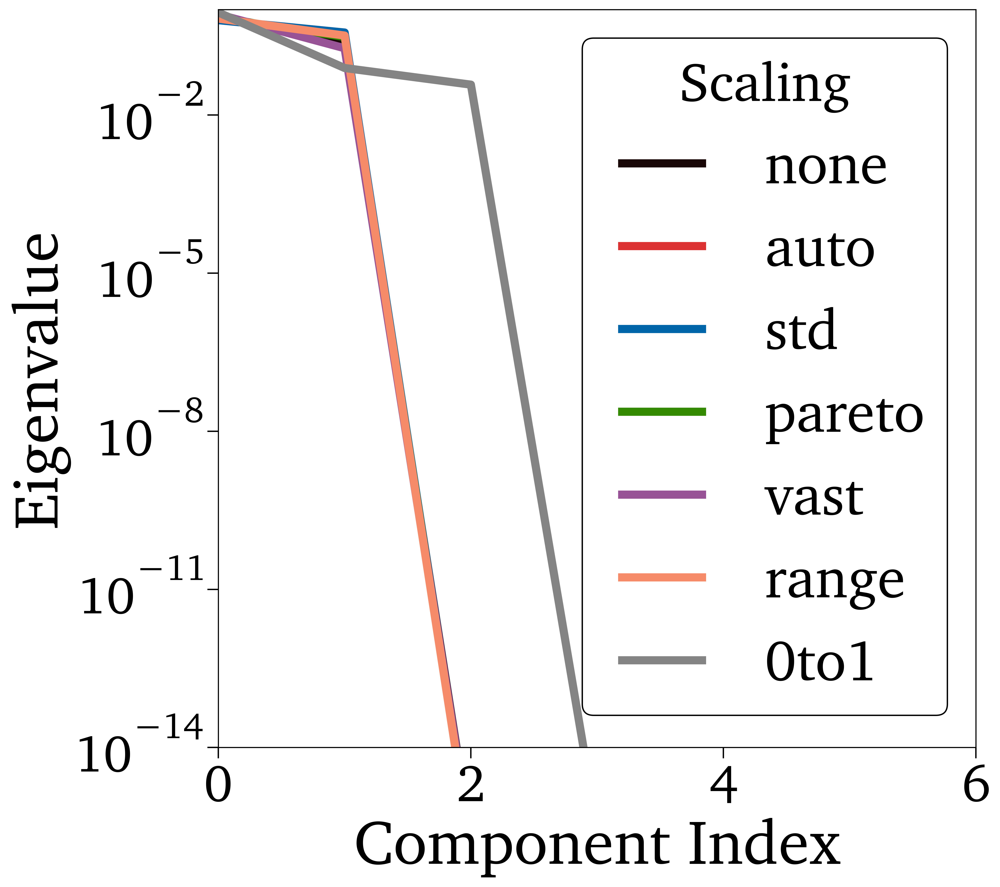

In [5]:
n_modes    = 6
ScalingVec = ['none', 'auto', 'std', 'pareto', 'vast', 'range', '0to1']
             # options: 'none', '', 'auto', 'std', 'pareto', 'vast', 'range', '0to1', '-1to1', 'level', 'max', 'poisson', 'vast_2', 'vast_3', 'vast_4'

fig, ax1 = plt.subplots()
#fig, ax2 = plt.subplots()
for j, Scaling in enumerate(ScalingVec):

    pca        = PCAA(yMat, scaling=Scaling, n_components=int(n_modes))
    C          = pca.X_center
    D          = pca.X_scale
    A          = pca.A[:,0:n_modes].T
    L          = pca.L
    AT         = A.T

    ax1.plot(L, label=Scaling)
    #ax2.plot(np.cumsum(L**2)/np.cumsum(L**2)[-1])
    
ax1.set_ylim([1.e-14, 1.e0])
ax1.set_xlabel('Component Index')
ax1.set_ylabel('Eigenvalue')
ax1.set_yscale('log')
ax1.legend(title='Scaling')
ax1.set_xlim([0,6])

# ax2.set_ylim([0.0, 1.e0])
# ax2.set_xlabel('Component Index')
# ax2.set_ylabel('Eigenvalue')
# ax2.legend()
# ax2.set_xlim([0,10])

if (FigDir):
    plt.savefig(FigDir+'/MSD_Eigenvalues_OneByOne_'+Vars[iVar]+'.eps', format='eps', bbox_inches='tight')

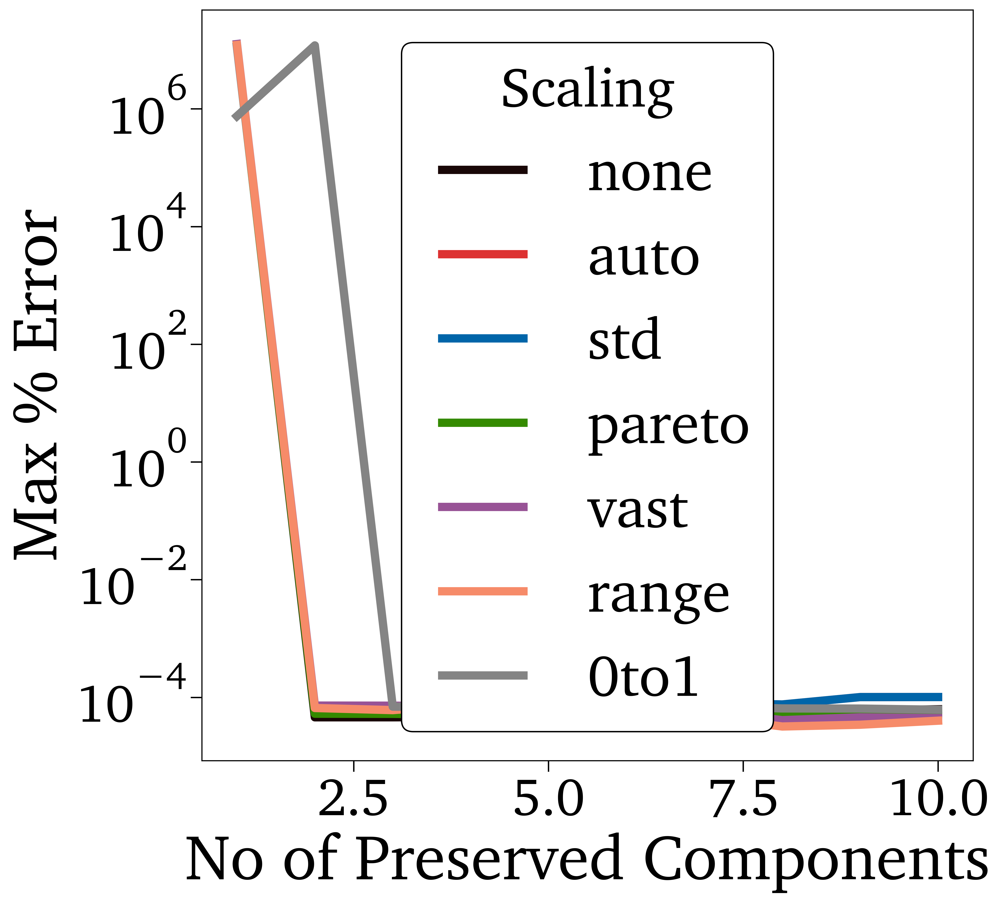

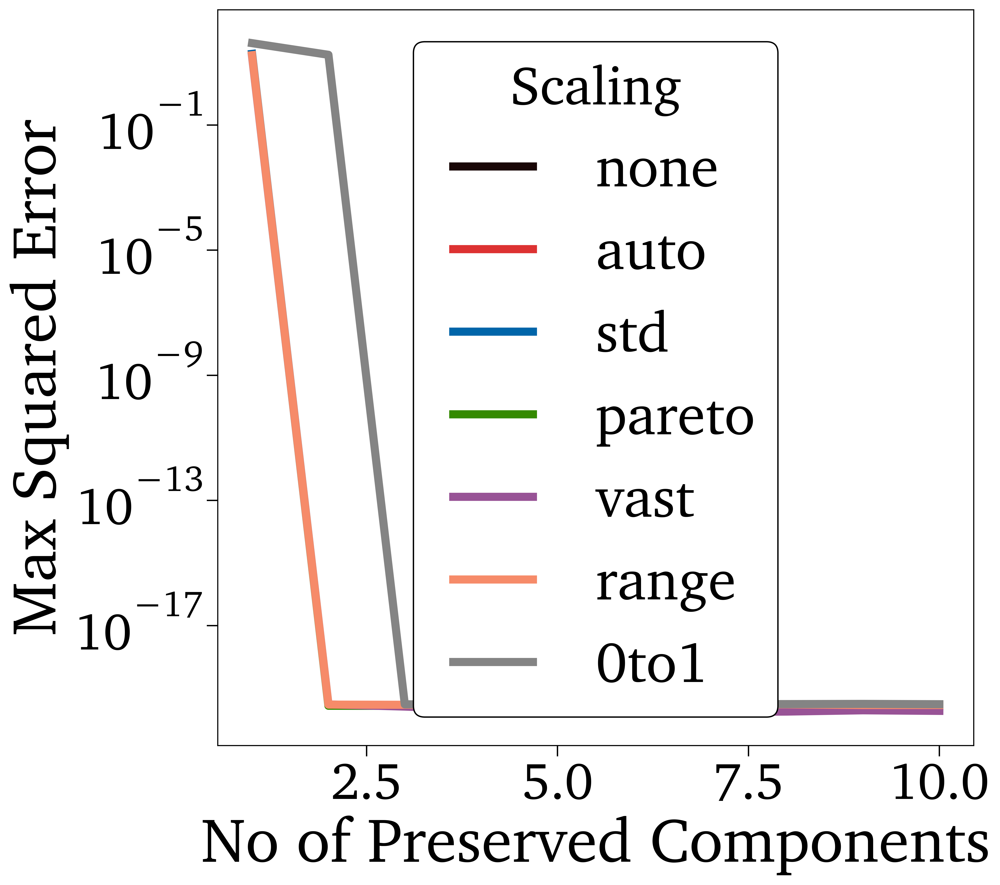

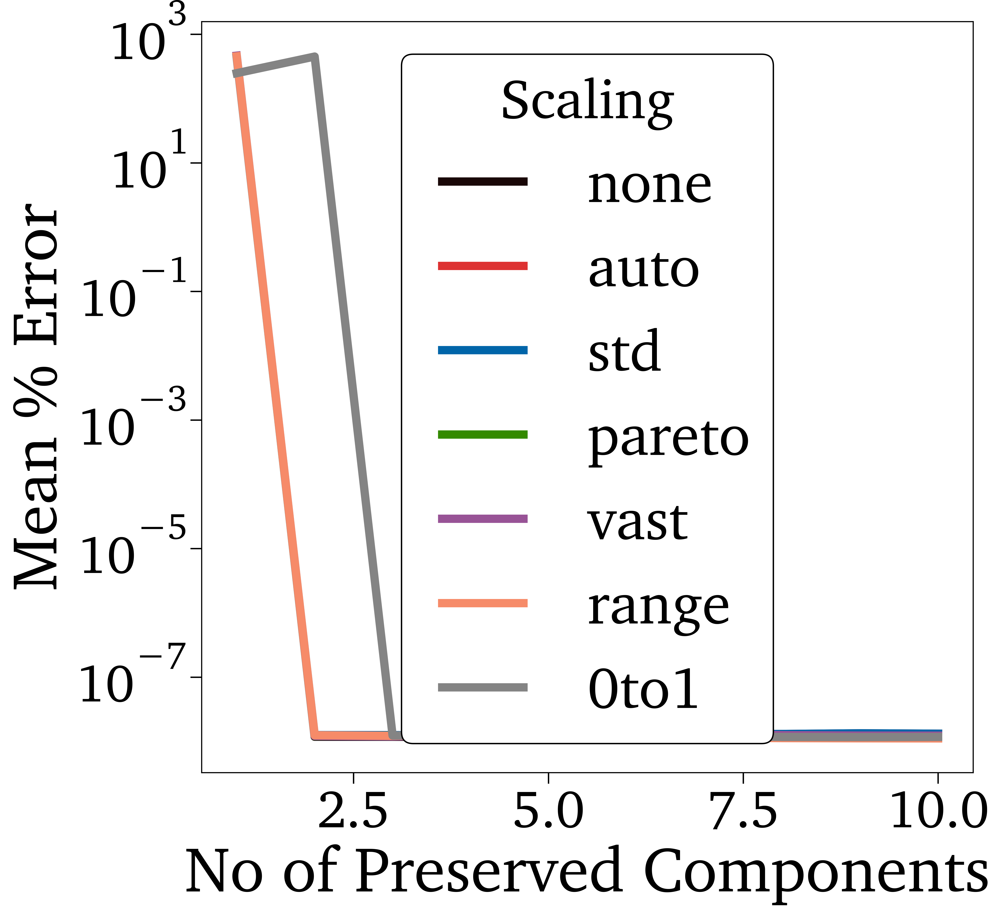

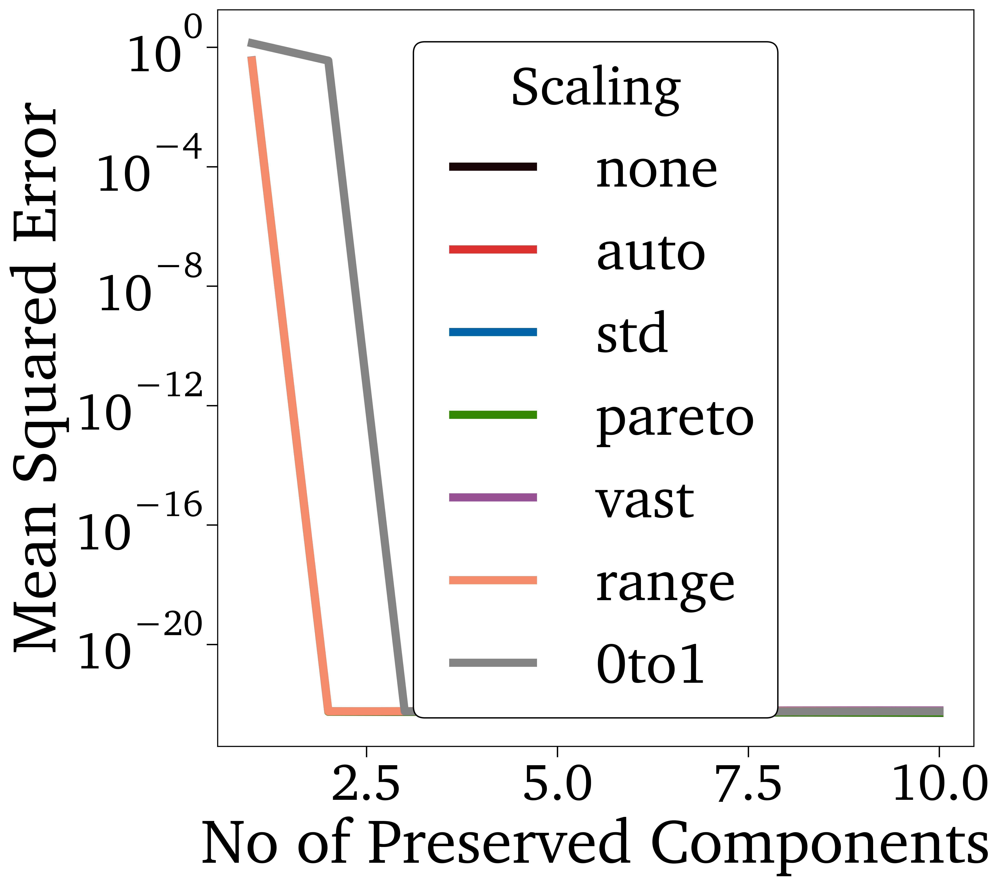

In [6]:
n_modesVec   = np.arange(1,11,1)
ScalingVec = ['none', 'auto', 'std', 'pareto', 'vast', 'range', '0to1']
#'none', '', 'auto', 'std', 'pareto', 'vast', 'range', '0to1', '-1to1', 'level', 'max', 'poisson', 'vast_2', 'vast_3', 'vast_4'

MaxPerc    = np.zeros((len(n_modesVec), len(ScalingVec)))
MaxSE      = np.zeros((len(n_modesVec), len(ScalingVec)))
MeanPerc   = np.zeros((len(n_modesVec), len(ScalingVec)))
MSE        = np.zeros((len(n_modesVec), len(ScalingVec)))
for i, n_modes in enumerate(n_modesVec):
    #print('n_modes = ', n_modes)
    
    for j, Scaling in enumerate(ScalingVec):

        pca        = PCAA(yMat, scaling=Scaling, n_components=int(n_modes))
        C          = pca.X_center
        D          = pca.X_scale
        A          = pca.A[:,0:n_modes].T
        L          = pca.L
        AT         = A.T

        yMat_pca   = ((yMat - C)/D).dot(AT)
        yMat_      = (yMat_pca.dot(A))*D + C
        
        MaxPerc[i,j]    = np.max(abs((yMat - yMat_)/yMat)*100)
        MaxSE[i,j]      = np.max((yMat - yMat_)**2)
        MeanPerc[i,j]   = np.mean(abs((yMat - yMat_)/yMat)*100)
        MSE[i,j]        = np.mean((yMat - yMat_)**2)

plt.figure()
plt.plot(n_modesVec, MaxPerc, label=ScalingVec)
plt.xlabel('No of Preserved Components')
plt.ylabel('Max % Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MaxSE, label=ScalingVec)
plt.xlabel('No of Preserved Components')
plt.ylabel('Max Squared Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MeanPerc, label=ScalingVec)
plt.xlabel('No of Preserved Components')
plt.ylabel('Mean % Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MSE, label=ScalingVec)
plt.xlabel('No of Preserved Components')
plt.ylabel('Mean Squared Error')
plt.legend(title='Scaling')
plt.yscale('log')

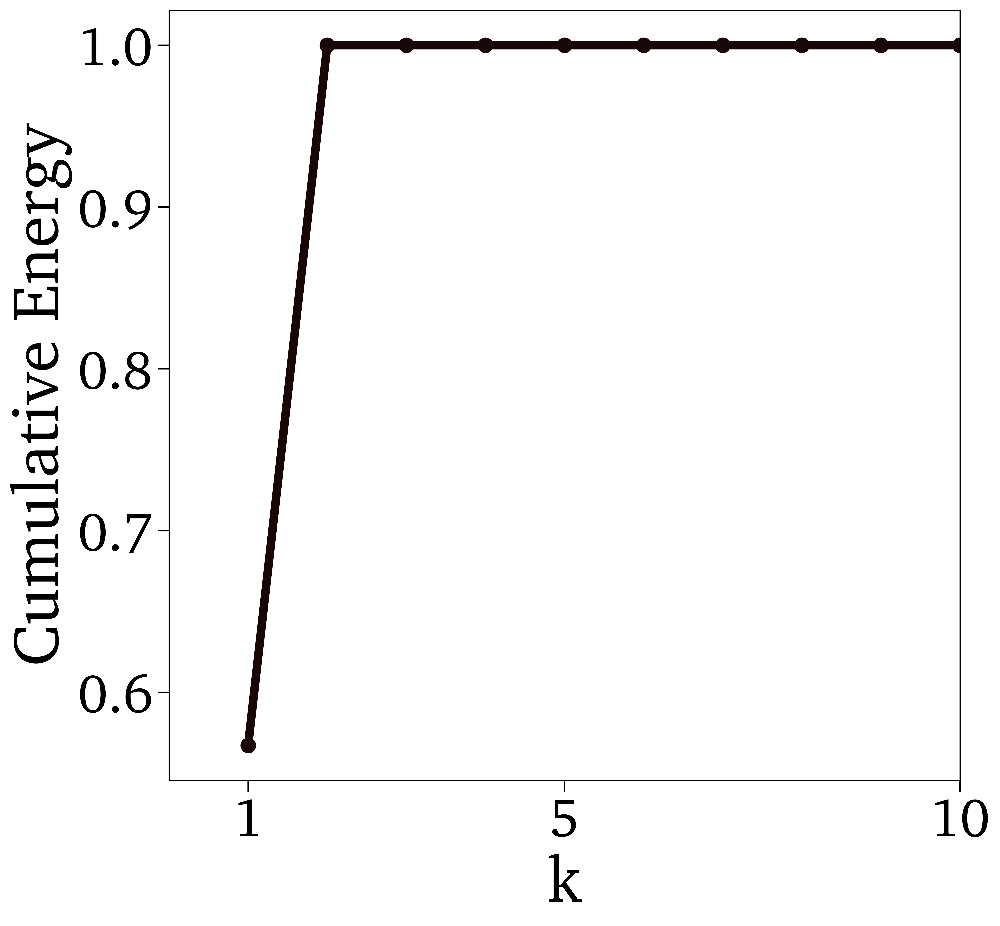

In [7]:
n_modes    = 6
ScalingVec = ['std']#, 'auto', 'std', 'pareto', 'vast', 'range', '0to1']
             # options: 'none', '', 'auto', 'std', 'pareto', 'vast', 'range', '0to1', '-1to1', 'level', 'max', 'poisson', 'vast_2', 'vast_3', 'vast_4'

fig = plt.figure()
for j, Scaling in enumerate(ScalingVec):

    pca        = PCAA(yMat, scaling=Scaling, n_components=int(n_modes), nocenter=False)
    C          = pca.X_center
    D          = pca.X_scale
    A          = pca.A[:,0:n_modes].T
    L          = pca.L
    LL         = np.maximum(L,0.)
    AT         = A.T

    plt.plot(np.arange(len(LL))+1, np.cumsum(np.sqrt(LL))/np.sum(np.sqrt(LL)),'-o')
    

plt.xlim([0, 10])
#plt.ylim([0.0, 1.1e0])
plt.xlabel(r'$k$')
plt.ylabel('Cumulative Energy')
plt.xticks([1,5,10])
#plt.yscale('log')

if (FigDir):
    plt.savefig(FigDir+'/MSD_CumEnergy_OneByOne_'+Vars[iVar]+'.eps', format='eps', bbox_inches='tight')

## Preserving the first $n_{modesFinal}$ Singular Values and Saving the Related Matrixes/Vectors

In [8]:
#n_modesFinal = 2

pca        = PCAA(yMat, scaling='std', n_components=n_modesFinal, nocenter=False)
C          = pca.X_center
D          = pca.X_scale
A          = pca.A[:,0:n_modesFinal].T
L          = pca.L
AT         = A.T
yMat_Scaled= ((yMat - C)/D)
print('[PCA] Shape of A        = ', A.shape)
print('[PCA] ')

[PCA] Shape of A        =  (2, 100)
[PCA] 


In [9]:
try:
    os.makedirs(OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/')
except:
    pass

FileName    = OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/A.csv'
np.savetxt(FileName, A, delimiter=',')

FileName    = OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/C.csv'
np.savetxt(FileName, C, delimiter=',')

FileName    = OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/D.csv'
np.savetxt(FileName, D, delimiter=',')

FileName    = OutputDir+'/'+str(PCAType)+'/PCA_'+mode_name+'/ROM/yMat_Scaled.csv'
np.savetxt(FileName, yMat_Scaled, delimiter=',')

### Reduction Error Estimate

In [10]:
#yMat_pca    = pca.transform(yMat, nocenter=False)
yMat_pca   = ((yMat - C)/D).dot(AT)

yMat_      = (yMat_pca.dot(A))*D + C
print('[PCA] Shape of yMat_pca = ', yMat_pca.shape)
print('[PCA]  Max % Error = ', np.max(abs((yMat - yMat_)/yMat)*100))
print('[PCA]  Max      SE = ', np.max((yMat - yMat_)**2))
print('[PCA] Mean % Error = ', np.mean(abs((yMat - yMat_)/yMat)*100))
print('[PCA]          MSE = ', np.mean((yMat - yMat_)**2))

[PCA] Shape of yMat_pca =  (500, 2)
[PCA]  Max % Error =  6.432844611525896e-05
[PCA]  Max      SE =  2.988417949347786e-20
[PCA] Mean % Error =  1.2577961064662849e-08
[PCA]          MSE =  5.806329763310304e-23


### Plotting the Components of the Projection Matrix

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

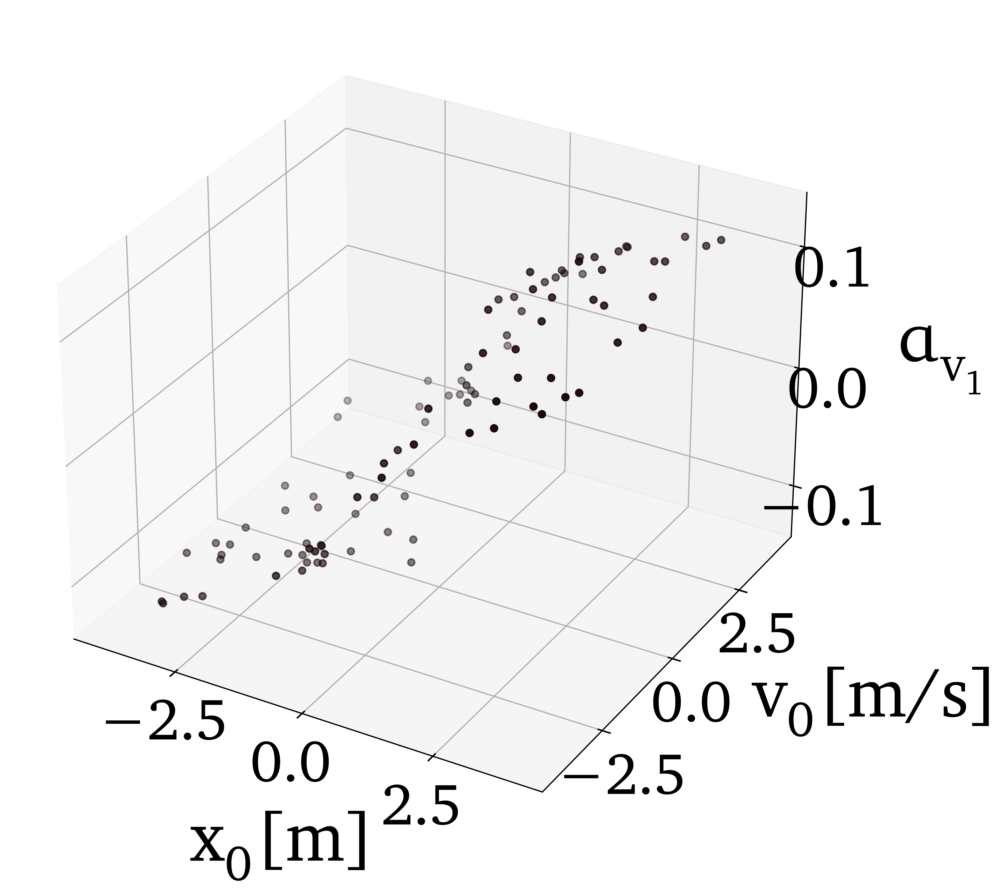

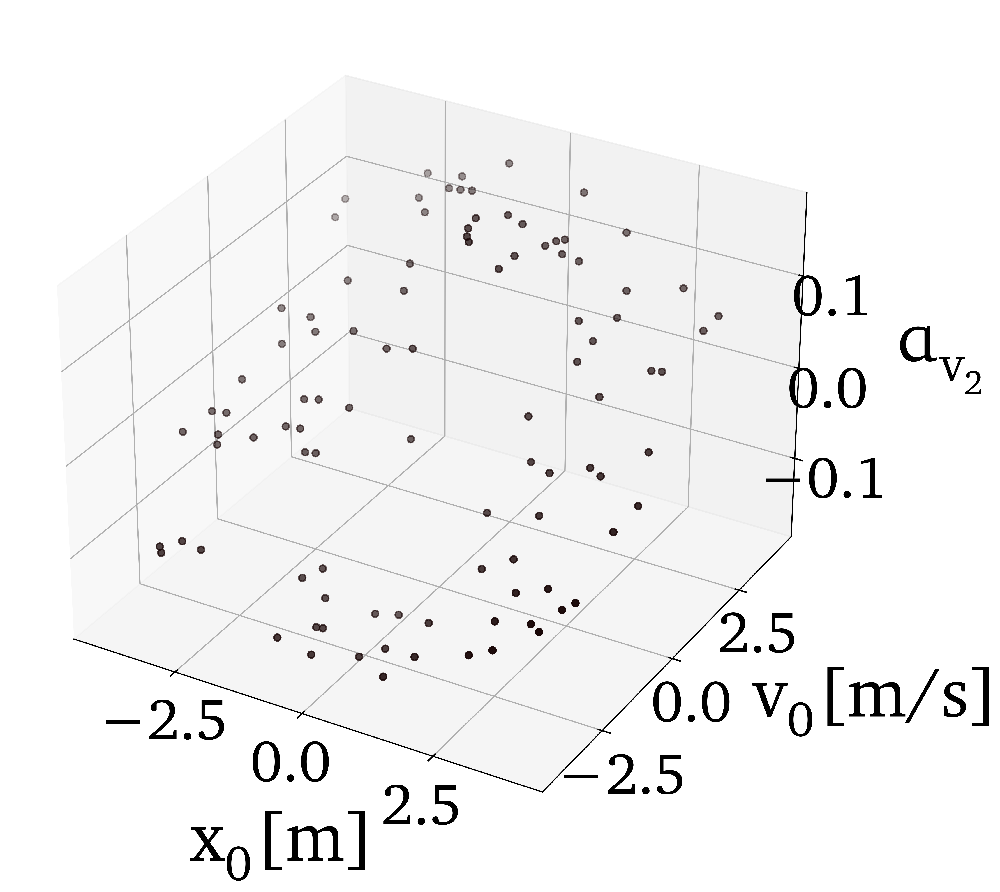

In [11]:
# %matplotlib qt


fig = plt.figure()
ax  = fig.add_subplot(projection='3d')
ax.scatter(ICs[:,0], ICs[:,1], A[0,:])
ax.set_xlabel('\n\n'+r'$x_{0} [m]$', rotation = 0)
ax.set_ylabel(r'                $v_{0} [m/s]$', rotation = 0)
ax.set_zlabel(r'        $\alpha_{'+Vars[iVar]+'_'+str(1)+'}$', rotation = 0)
ax.xaxis.set_rotate_label(False)
ax.yaxis.set_rotate_label(False)
ax.zaxis.set_rotate_label(False)

if (FigDir):
    plt.savefig(FigDir+'/MSD_Alpha1_'+mode_name+'.eps', format='eps', bbox_inches='tight')


fig = plt.figure()
ax  = fig.add_subplot(projection='3d')
ax.scatter(ICs[:,0], ICs[:,1], A[1,:])
ax.set_xlabel('\n\n'+r'$x_{0} [m]$', rotation = 0)
ax.set_ylabel(r'                $v_{0} [m/s]$', rotation = 0)
ax.set_zlabel(r'        $\alpha_{'+Vars[iVar]+'_'+str(2)+'}$', rotation = 0)
ax.xaxis.set_rotate_label(False)
ax.yaxis.set_rotate_label(False)
ax.zaxis.set_rotate_label(False)

if (FigDir):
    plt.savefig(FigDir+'/MSD_Alpha2_'+mode_name+'.eps', format='eps', bbox_inches='tight')

### Plotting Eigenmodes

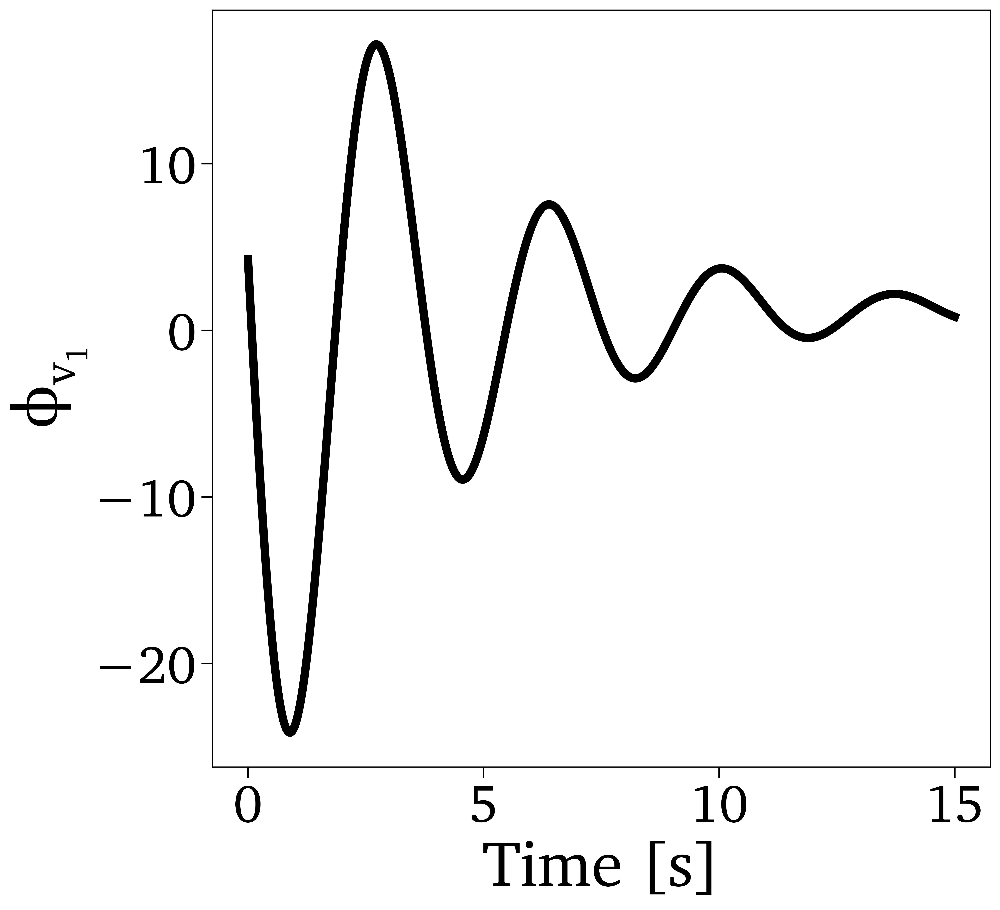

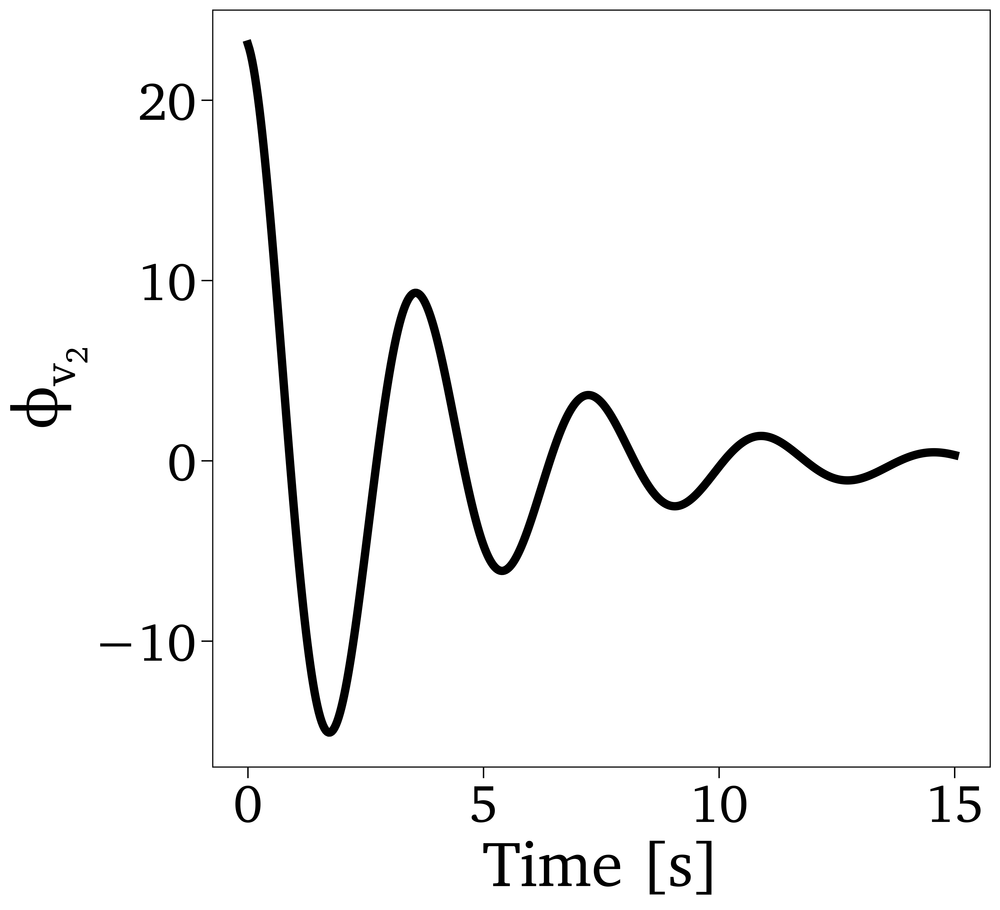

In [12]:
plt.figure()
plt.plot(tVec, yMat_pca[:,0], '-k')
plt.xlabel('Time [s]')
plt.ylabel(r'$\phi_{'+Vars[iVar]+'_'+str(1)+'}$')

if (FigDir):
    plt.savefig(FigDir+'/MSD_OneByOne_'+str(Vars[iVar])+'_phi1.eps', format='eps', bbox_inches='tight')



plt.figure()
plt.plot(tVec, yMat_pca[:,1], '-k')
plt.xlabel('Time [s]')
plt.ylabel(r'$\phi_{'+Vars[iVar]+'_'+str(2)+'}$')

if (FigDir):
    plt.savefig(FigDir+'/MSD_OneByOne_'+str(Vars[iVar])+'_phi2.eps', format='eps', bbox_inches='tight')

### Comparing Original Data vs Encoded-Decoded Data

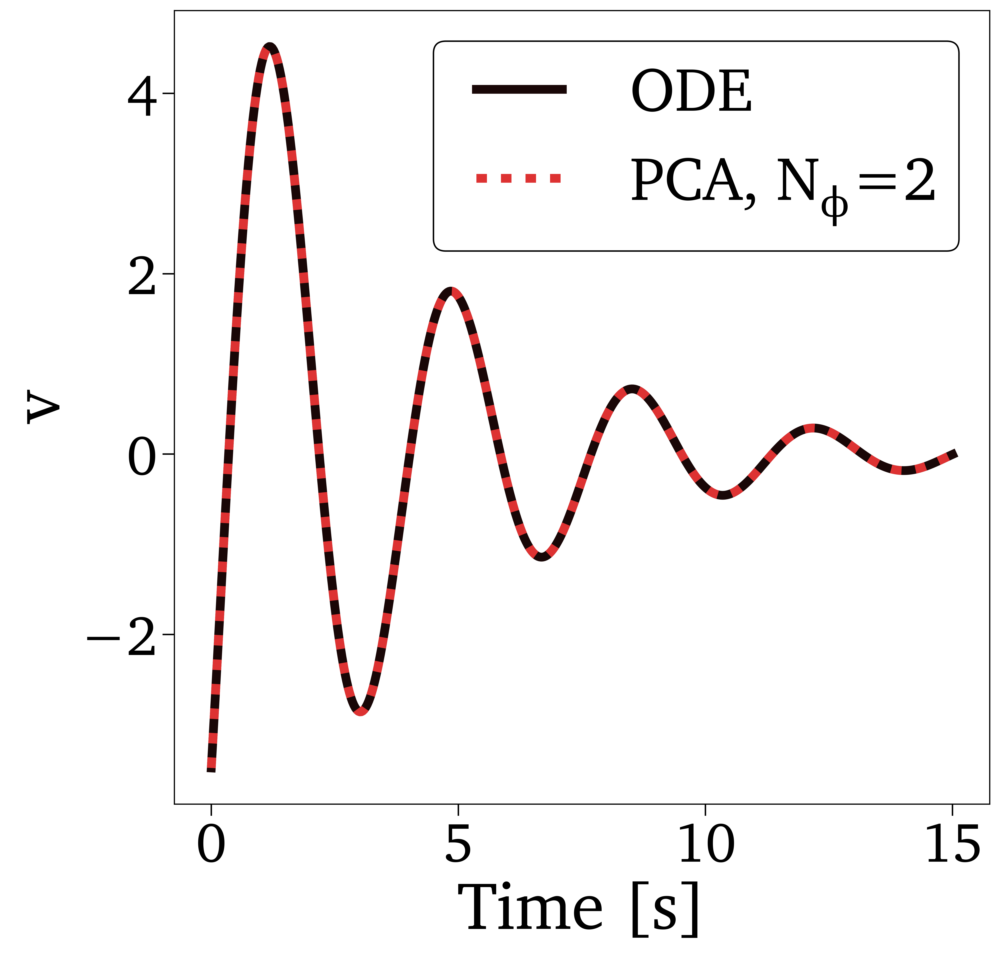

In [13]:
iScenario = 1

plt.figure()
plt.plot(tVec, yMat[:,iScenario],  '-', label='ODE')
plt.plot(tVec, yMat_[:,iScenario], ':', label='PCA, $N_{\phi}$='+str(n_modesFinal))
plt.xlabel('Time [s]')
plt.ylabel(r''+Vars[iVar])
plt.legend()